<a href="https://colab.research.google.com/github/anky19698/Capstone/blob/main/Cricket%20Shot%20Pose%20Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-f8hkju7l
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-f8hkju7l
  Resolved https://github.com/facebookresearch/detectron2.git to commit 3ff5dd1cff4417af07097064813c9f28d7461d3c
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 13.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 43.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 15.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for detectron2: filename=detectron2-0.6-cp310-cp310-linux_x86_64.whl size=5740709 sha256=3b27024ca70a0106718fb18901d4

In [2]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [3]:
import os
path = "/content/drive/MyDrive/getty/"
folders = os.listdir(path)
print(folders)

['drive', 'cutshot', 'sweep', 'pullshot']


In [4]:
import cv2
print(dir(cv2))
images  = []
labels  = []

# Define your image dimensions
target_height, target_width = 400, 400

for folder in folders:
  names = os.listdir(path + folder)
  print(folder)
  i = 0
  for name in names:
    image = cv2.imread(path + folder + '/' + name)
    # Resize image while maintaining aspect ratio
    height, width, _ = image.shape
    aspect_ratio = width / height
    if aspect_ratio > 1:  # landscape orientation
        new_width = target_width
        new_height = int(new_width / aspect_ratio)
    else:  # portrait or square orientation
        new_height = target_height
        new_width = int(new_height * aspect_ratio)

    # Resize image to target dimensions
    resized_image = cv2.resize(image, (new_width, new_height))

    # Create padding to achieve target dimensions
    top_pad = (target_height - new_height) // 2
    bottom_pad = target_height - new_height - top_pad
    left_pad = (target_width - new_width) // 2
    right_pad = target_width - new_width - left_pad
    padded_image = cv2.copyMakeBorder(resized_image, top_pad, bottom_pad, left_pad, right_pad, cv2.BORDER_CONSTANT, value=(0, 0, 0))

    i+=1
#     if i>25:
#         break


    images.append(padded_image)
    labels.append(folder)


['ACCESS_FAST', 'ACCESS_MASK', 'ACCESS_READ', 'ACCESS_RW', 'ACCESS_WRITE', 'ADAPTIVE_THRESH_GAUSSIAN_C', 'ADAPTIVE_THRESH_MEAN_C', 'AGAST_FEATURE_DETECTOR_AGAST_5_8', 'AGAST_FEATURE_DETECTOR_AGAST_7_12D', 'AGAST_FEATURE_DETECTOR_AGAST_7_12S', 'AGAST_FEATURE_DETECTOR_NONMAX_SUPPRESSION', 'AGAST_FEATURE_DETECTOR_OAST_9_16', 'AGAST_FEATURE_DETECTOR_THRESHOLD', 'AKAZE', 'AKAZE_DESCRIPTOR_KAZE', 'AKAZE_DESCRIPTOR_KAZE_UPRIGHT', 'AKAZE_DESCRIPTOR_MLDB', 'AKAZE_DESCRIPTOR_MLDB_UPRIGHT', 'AKAZE_create', 'AffineFeature', 'AffineFeature_create', 'AffineTransformer', 'AgastFeatureDetector', 'AgastFeatureDetector_AGAST_5_8', 'AgastFeatureDetector_AGAST_7_12d', 'AgastFeatureDetector_AGAST_7_12s', 'AgastFeatureDetector_NONMAX_SUPPRESSION', 'AgastFeatureDetector_OAST_9_16', 'AgastFeatureDetector_THRESHOLD', 'AgastFeatureDetector_create', 'Algorithm', 'AlignExposures', 'AlignMTB', 'AsyncArray', 'BFMatcher', 'BFMatcher_create', 'BORDER_CONSTANT', 'BORDER_DEFAULT', 'BORDER_ISOLATED', 'BORDER_REFLECT', '

In [5]:
len(images)

620

# MediaPipe

In [ ]:
pip install ultralytics

In [ ]:
pip install mediapipe

In [ ]:
# imports
import os
import cv2
import math
import json
import pickle
import numpy as np
import pandas as pd
import mediapipe as mp
from tqdm import tqdm, trange
import matplotlib.pyplot as plt
from ultralytics import YOLO

# pandas settings
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.width', None)

#ignore warnings
import warnings
warnings.filterwarnings("ignore")

In [ ]:
# Initialize MediaPipe Pose
mp_pose = mp.solutions.pose
pose = mp_pose.Pose()

In [ ]:
def show_pose(im):
    results = pose.process(im)
    if results.pose_landmarks:

        mp_drawing = mp.solutions.drawing_utils
        image_with_landmarks = im.copy()
        mp_drawing.draw_landmarks(image_with_landmarks, results.pose_landmarks, mp_pose.POSE_CONNECTIONS)
        image_with_landmarks = cv2.cvtColor(image_with_landmarks, cv2.COLOR_BGR2RGB)

        plt.figure(figsize = (10,10))
        plt.imshow(image_with_landmarks)
        plt.show()

    else:
        plt.figure(figsize = (10,10))
        plt.imshow(im)
        plt.show()

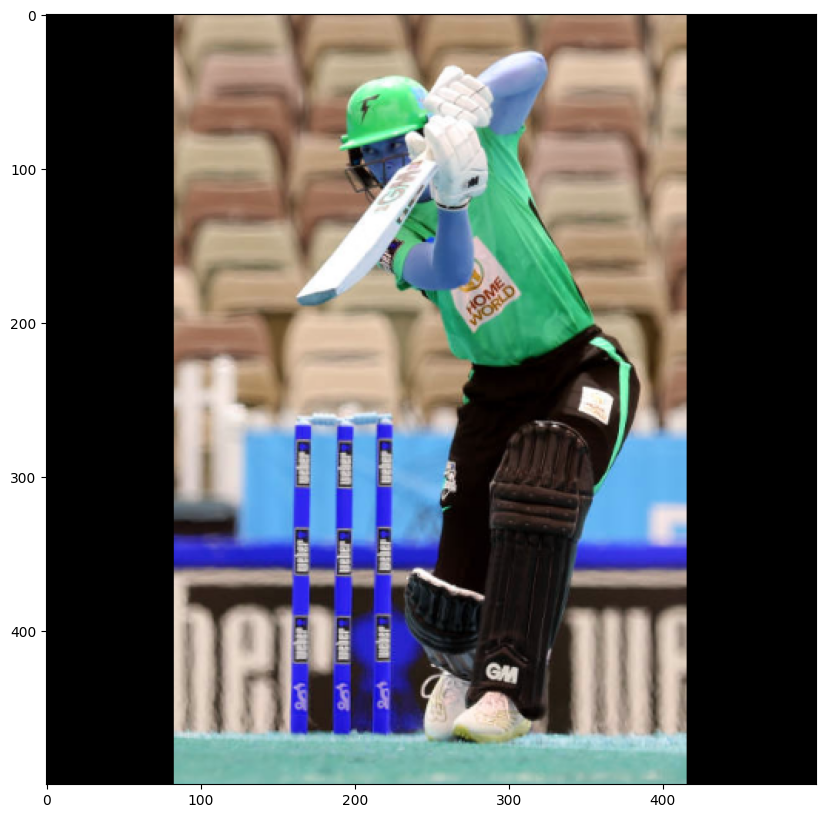

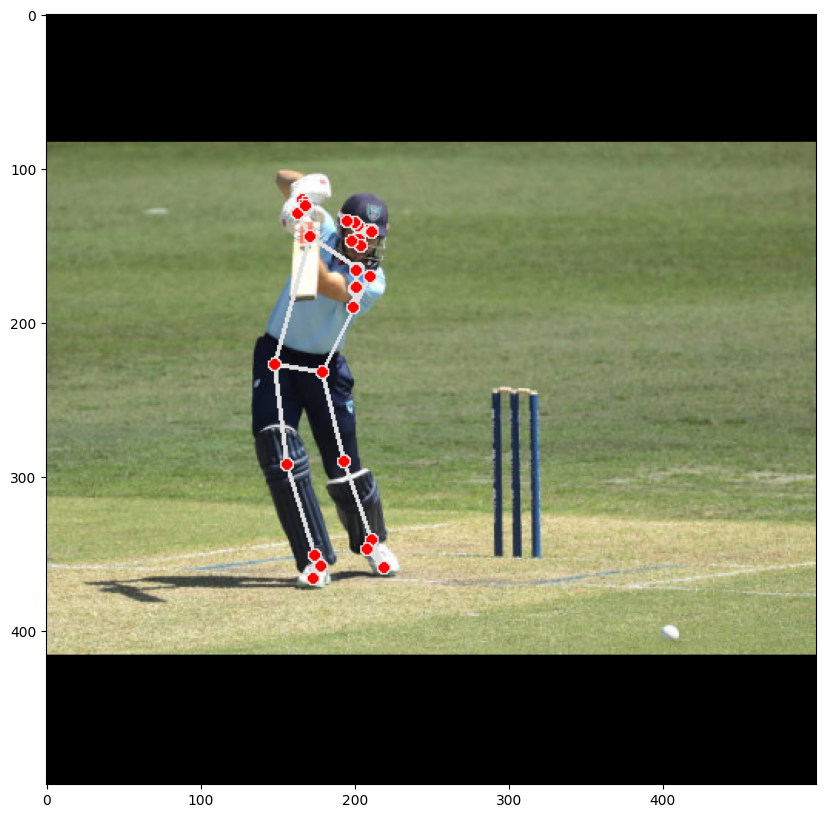

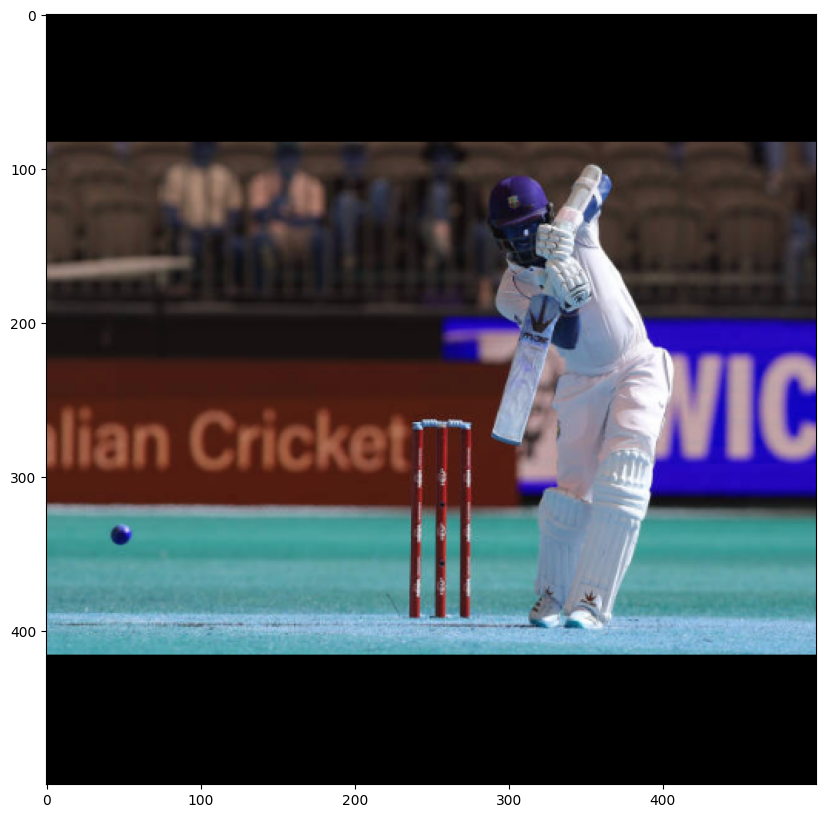

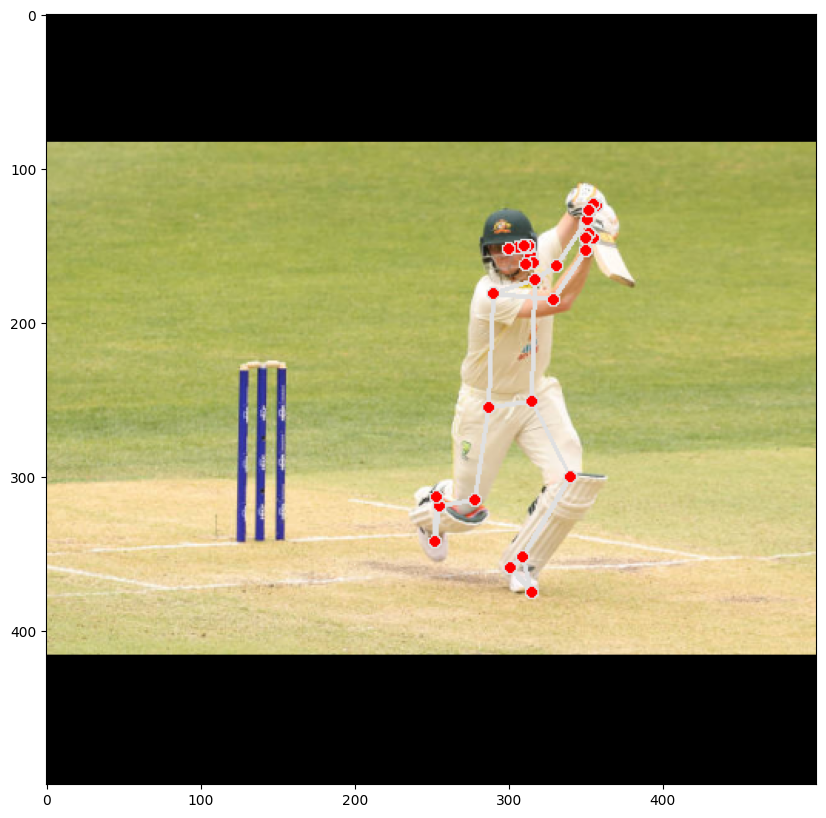

In [ ]:
for i in range(4):
    # im = cv2.imread(i)
    show_pose(images[i])

# TF Pose Estimation

In [ ]:
pip install openpose-python


ERROR: Could not find a version that satisfies the requirement openpose-python (from versions: none)
ERROR: No matching distribution found for openpose-python


# Detectron2

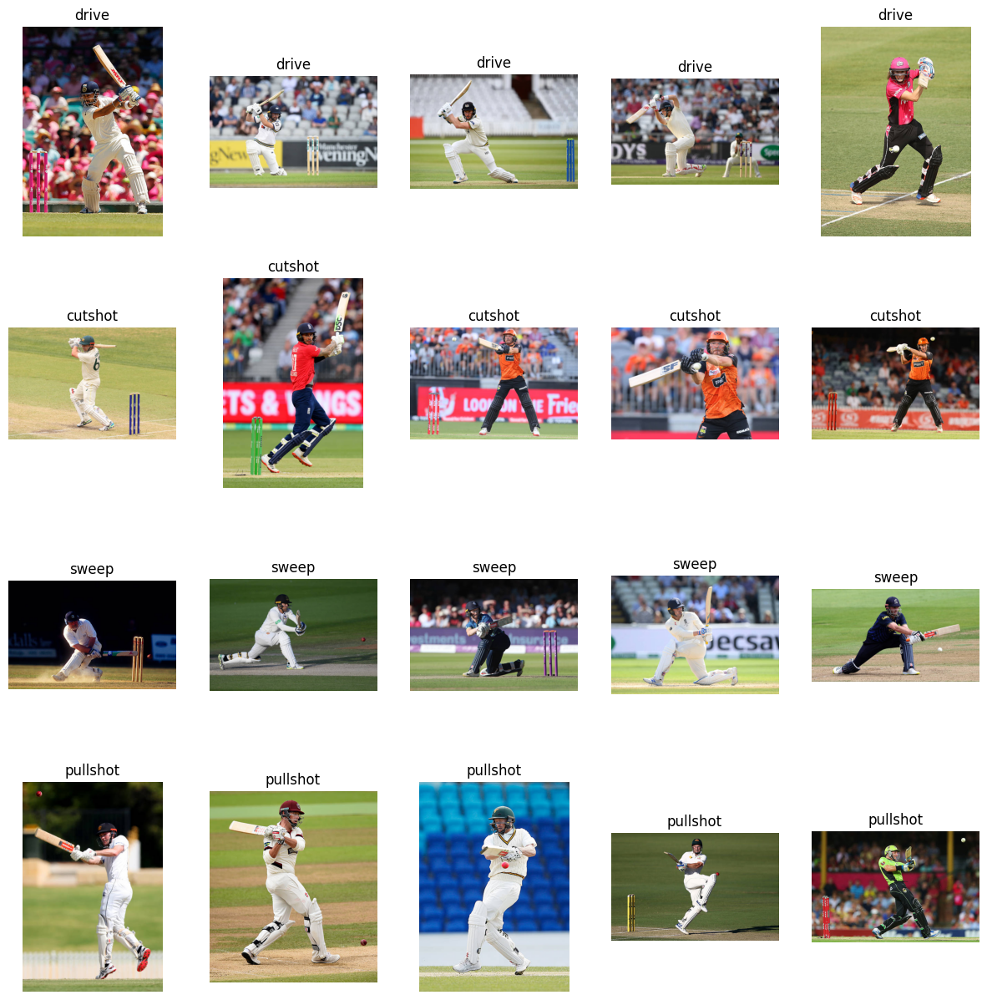

In [9]:
import matplotlib.pyplot as plt

import random

fig, ax = plt.subplots(nrows=4, ncols=5, figsize=(15,15))

for i in range(len(folders)):
  names = os.listdir(path + folders[i])
  names = random.sample(names, 5)
  for j in range(len(names)):
    img = cv2.imread(path + folders[i] + "/" + names[j])

    # scale_percent = 50 # percent of original size
    # width = int(img.shape[1] * scale_percent / 100)
    # height = int(img.shape[0] * scale_percent / 100)
    # dim = (width, height)
    # img = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ax[i,j].imshow(img)
    ax[i, j].set_title(folders[i])
    ax[i, j].axis('off')


In [10]:
# image augmentation
aug_images=[]
aug_labels=[]
# for each image in training data
for idx in range(len(images)):
  # fetch an image and label
  img  = images[idx]
  label= labels[idx]
  # flip an image
  img_flip = cv2.flip(img, 1)
  # append augmented image to list
  aug_images.append(img_flip)
  # append label to list
  aug_labels.append(label)

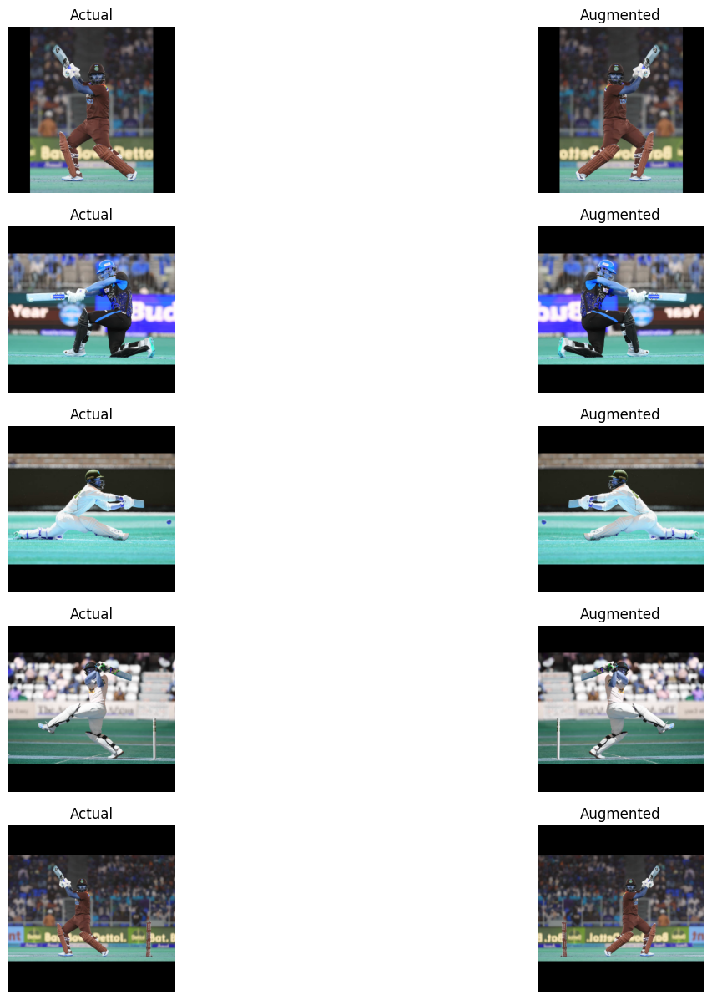

In [11]:
# display actual and augmented image for sample images
# create indices
ind = range(len(aug_images))
# randomly sample indices
ind = random.sample(ind, 5)
# create subplots with 5 rows and 2 columns
fig, ax = plt.subplots(nrows=5, ncols=2, figsize=(15,15))
# for each row
for row in range(5):
  # for each column
  for col in range(2):
    # first column for actual image
    if col==0:
      # display actual image
      ax[row, col].imshow(images[ ind[row] ] )
      # set title
      ax[row, col].set_title('Actual')
      # Turn off axis
      ax[row, col].axis('off')
    # second column for augmented image
    else:
      # display augmented image
      ax[row, col].imshow(aug_images[ ind[row] ] )
      # set title
      ax[row, col].set_title('Augmented')
      # Turn off axis
      ax[row, col].axis('off')




In [12]:
# Define a function to rotate images by 30 degrees with padding
def rotate_image_with_padding(img):
    # Get image dimensions
    h, w = img.shape[:2]

    # Compute rotation matrix for rotating the image by 30 degrees
    rotation_matrix = cv2.getRotationMatrix2D((w / 2, h / 2), 30, 1)

    # Compute sine and cosine of the rotation angle
    sin_theta = abs(rotation_matrix[0, 1])
    cos_theta = abs(rotation_matrix[0, 0])

    # Compute dimensions of the rotated image
    new_w = int((h * sin_theta) + (w * cos_theta))
    new_h = int((h * cos_theta) + (w * sin_theta))

    # Adjust the rotation matrix for the translation caused by the rotation
    rotation_matrix[0, 2] += (new_w / 2) - (w / 2)
    rotation_matrix[1, 2] += (new_h / 2) - (h / 2)

    # Perform rotation with padding
    rotated_img = cv2.warpAffine(img, rotation_matrix, (new_w, new_h), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT, borderValue=(0, 0, 0))

    return rotated_img


# Example usage
# aug_images = []
# aug_labels = []

# for each image in training data
for idx in range(len(images)):
    # fetch an image and label
    img = images[idx]
    label = labels[idx]

    # Rotate the image by 30 degrees with padding
    rotated_img = rotate_image_with_padding(img)

    # Append augmented image to list
    aug_images.append(rotated_img)

    # Append label to list
    aug_labels.append(label)

In [ ]:
# display actual and augmented image for sample images
# create indices
ind = range(len(aug_images))
# randomly sample indices
ind = random.sample(ind, 5)
# create subplots with 5 rows and 2 columns
fig, ax = plt.subplots(nrows=5, ncols=2, figsize=(15,15))
# for each row
for row in range(5):
  # for each column
  for col in range(2):
    # first column for actual image
    if col==0:
      # display actual image
      ax[row, col].imshow(images[ ind[row] ] )
      # set title
      ax[row, col].set_title('Actual')
      # Turn off axis
      ax[row, col].axis('off')
    # second column for augmented image
    else:
      # display augmented image
      ax[row, col].imshow(aug_images[ ind[row] ] )
      # set title
      ax[row, col].set_title('Augmented')
      # Turn off axis
      ax[row, col].axis('off')

In [14]:
images = images + aug_images
labels = labels + aug_labels
# number of images
len(images)


1860

In [15]:
  # import some common detectron2 utilities
# to obtain pretrained models
from detectron2 import model_zoo
# set up predictor
from detectron2.engine import DefaultPredictor
# set config
from detectron2.config import get_cfg
# define configure instance
cfg = get_cfg()

cfg.MODEL.DEVICE = 'cpu'

# get a model specified by relative path under Detectron2’s official configs/ directory.
cfg.merge_from_file(model_zoo.get_config_file("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml"))
# download pretrained model
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml")

# cfg.merge_from_file(model_zoo.get_config_file("COCO-Keypoints/keypoint_rcnn_X_101_32x8d_FPN_3x.yaml"))

# cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Keypoints/keypoint_rcnn_X_101_32x8d_FPN_3x.yaml")

# set threshold for this model
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.8

# Increase batch size for faster inference
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128

# Optional: Adjust learning rate and maximum iterations for better accuracy (if training)
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 1000



# create predictor
predictor = DefaultPredictor(cfg)

model_final_a6e10b.pkl: 237MB [00:01, 214MB/s]                           


/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


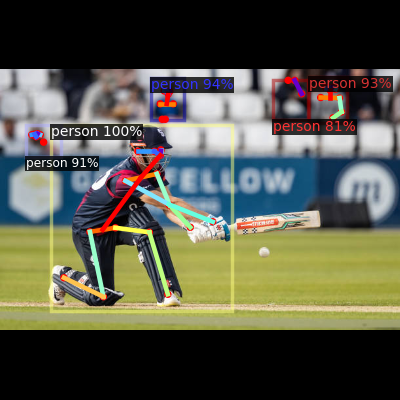

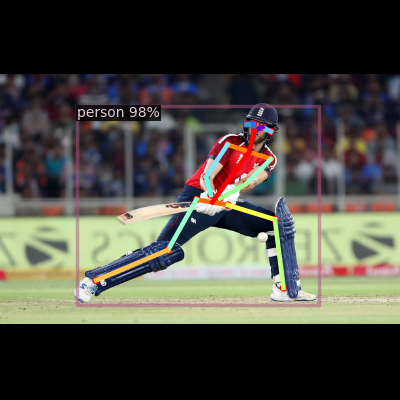

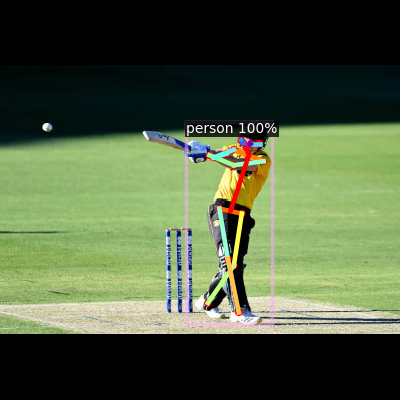

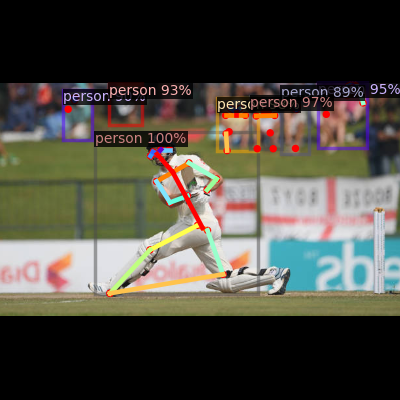

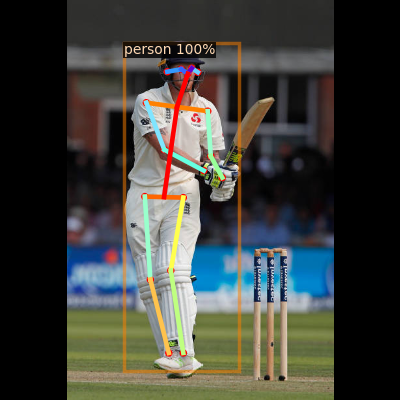

In [16]:
# for drawing predictions on images
from detectron2.utils.visualizer import Visualizer
# to obtain metadata
from detectron2.data import MetadataCatalog
# to display an image
from google.colab.patches import cv2_imshow
# randomly select images
for img in random.sample(images,5):
    # make predictions
    outputs = predictor(img)
    # use `Visualizer` to draw the predictions on the image.
    v = Visualizer(img[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1)
    # draw prediction on image
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    # display image
    cv2_imshow(v.get_image()[:, :, ::-1])

In [17]:
import numpy as np

In [18]:
# define function that extracts the keypoints for an image
keypoints   = []
lbl = []
def extract_keypoints(img):
  # make predictions
  outputs = predictor(img)
  # fetch keypoints
  kps = outputs['instances'].pred_keypoints
  # convert to numpy array
  kp = kps.cpu().numpy()
  # print(kp)
  # if keypoints detected
  if(len(kps)>0):
    # fetch keypoints of a person with maximum confidence score
    kp = kp[0]
    kp = np.delete(kp,2,1)
    # convert 2D array to 1D array
    kp = kp.flatten()
    # return keypoints
    return kp
    # keypoints.append(kp)

    # print(len(keypoints))

In [19]:
import concurrent.futures
import multiprocessing
# progress bar
from tqdm import tqdm
import numpy as np
# create list
# for every image
# with concurrent.futures.ThreadPoolExecutor(max_workers=20) as executor:
#   futures = [executor.submit(extract_keypoints, images[i]) for i in range(len(images))]
#   for future in concurrent.futures.as_completed(futures):
#     future.result()

# images = images[:10]

# num_processes = multiprocessing.cpu_count()  # Use the number of available CPU cores
# print(num_processes)
# # Create a multiprocessing pool with the desired number of processes
# with multiprocessing.Pool(processes=num_processes) as pool:
#     # Use tqdm to track the progress of processing images
#     results = list(tqdm(pool.imap(extract_keypoints, images), total=len(images)))


for i in tqdm(range(len(images))):
  # extract keypoints
  kp = extract_keypoints(images[i])
  lbl.append(labels[i])
  # append keypoints
  # print(kp)
  keypoints.append(kp)

100%|██████████| 1860/1860 [3:01:07<00:00,  5.84s/it]


In [20]:
# Eliminating Missing Keypoints
new_keypoints = []
new_labels = []

for i in range(len(keypoints)):

    if keypoints[i] is not None:

        new_keypoints.append(keypoints[i])
        new_labels.append(lbl[i])
    else:
        print(i)

1418


In [21]:
keypoints, labels = new_keypoints, new_labels

In [24]:
from numpy import savetxt

savetxt('data_R50.csv', keypoints, delimiter=',')
savetxt('data_R50_labels.csv', labels, fmt='%s')

In [ ]:
len(images),len(new_keypoints), len(new_labels)

(100, 100, 100)

In [ ]:
# for normalization
from sklearn.preprocessing import StandardScaler
# define normalizer
scaler= StandardScaler()
# normalize keypoints
keypoints = scaler.fit_transform(keypoints)
# convert to an array
keypoints = np.array(keypoints)

In [ ]:
# converting the target categories into numbers
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y=le.fit_transform(labels)

In [ ]:
# for creating training and validation sets
from sklearn.model_selection import train_test_split
# split keypoints and labels in 80:20
x_tr, x_val, y_tr, y_val = train_test_split(keypoints, y, test_size=0.2, stratify=labels,
                                        random_state=120)

In [ ]:
# converting the keypoints and target value to tensor
import torch
x_tr = torch.Tensor(x_tr)
x_val = torch.Tensor(x_val)
y_tr = torch.Tensor(y_tr)
y_tr = y_tr.type(torch.long)
y_val = torch.Tensor(y_val)
y_val = y_val.type(torch.long)

In [ ]:
# shape of training and validation set
(x_tr.shape, y_tr.shape), (x_val.shape, y_val.shape)

((torch.Size([1487, 34]), torch.Size([1487])),
 (torch.Size([372, 34]), torch.Size([372])))

In [ ]:
# importing libraries for defining the architecture of model
from torch.autograd import Variable
from torch.optim import Adam
from torch.nn import Linear, ReLU, Sequential, Softmax, CrossEntropyLoss, Conv2d
# defining the model architecture
model = Sequential(Linear(34, 64),
                   ReLU(),
                   Linear(64, 4),
                   Softmax()
                   )



In [ ]:
# define optimizer and loss function
optimizer = Adam(model.parameters(), lr=0.01)
criterion = CrossEntropyLoss()
# checking if GPU is available
if torch.cuda.is_available():
    model = model.cuda()
    criterion = criterion.cuda()

In [ ]:
def train(epoch):
    model.train()
    tr_loss = 0
    # getting the training set
    x_train, y_train = Variable(x_tr), Variable(y_tr)
    # getting the validation set
    x_valid, y_valid = Variable(x_val), Variable(y_val)
    # converting the data into GPU format
    if torch.cuda.is_available():
        x_train = x_train.cuda()
        y_train = y_train.cuda()
        x_valid = x_valid.cuda()
        y_valid = y_valid.cuda()
    # clearing the Gradients of the model parameters
    optimizer.zero_grad()
    # prediction for training and validation set
    output_train = model(x_train)
    output_val = model(x_valid)
    # computing the training and validation loss
    loss_train = criterion(output_train, y_train)
    loss_val = criterion(output_val, y_valid)
    # computing the updated weights of all the model parameters
    loss_train.backward()
    optimizer.step()
    if epoch%10 == 0:
        # printing the validation loss
        print('Epoch : ',epoch+1, 't', 'loss :', loss_val.item())

In [ ]:
# defining the number of epochs
n_epochs = 1000
# training the model
for epoch in range(n_epochs):
    train(epoch)

Epoch :  1 t loss : 1.3806073665618896
Epoch :  11 t loss : 1.1632506847381592
Epoch :  21 t loss : 1.0480374097824097
Epoch :  31 t loss : 0.9858452677726746
Epoch :  41 t loss : 0.9721850156784058
Epoch :  51 t loss : 0.9640038013458252
Epoch :  61 t loss : 0.957913875579834
Epoch :  71 t loss : 0.9513851404190063
Epoch :  81 t loss : 0.9481750726699829
Epoch :  91 t loss : 0.9438208937644958
Epoch :  101 t loss : 0.9416832327842712
Epoch :  111 t loss : 0.9385297894477844
Epoch :  121 t loss : 0.934760570526123
Epoch :  131 t loss : 0.9298396706581116
Epoch :  141 t loss : 0.9271996021270752
Epoch :  151 t loss : 0.9258747696876526
Epoch :  161 t loss : 0.9249097108840942
Epoch :  171 t loss : 0.9230526089668274
Epoch :  181 t loss : 0.9222226738929749
Epoch :  191 t loss : 0.9211490750312805
Epoch :  201 t loss : 0.9193210601806641
Epoch :  211 t loss : 0.9167845249176025
Epoch :  221 t loss : 0.9126436114311218
Epoch :  231 t loss : 0.9109702110290527
Epoch :  241 t loss : 0.90946

In [ ]:
# to check the model performance
from sklearn.metrics import accuracy_score
# get validation accuracy
x, y = Variable(x_val), Variable(y_val)
if torch.cuda.is_available():
  x_val = x.cuda()
  y_val = y.cuda()
pred = model(x_val)
final_pred = np.argmax(pred.cpu().data.numpy(), axis=1)
accuracy_score(y_val.cpu(), final_pred)

0.8467741935483871

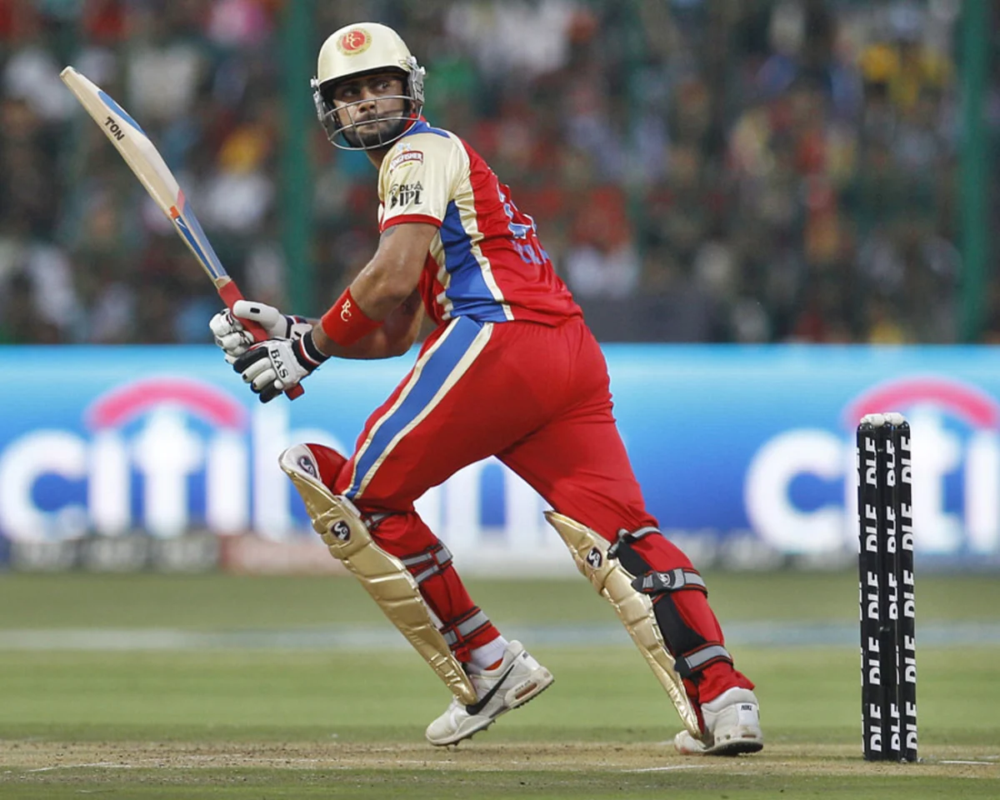

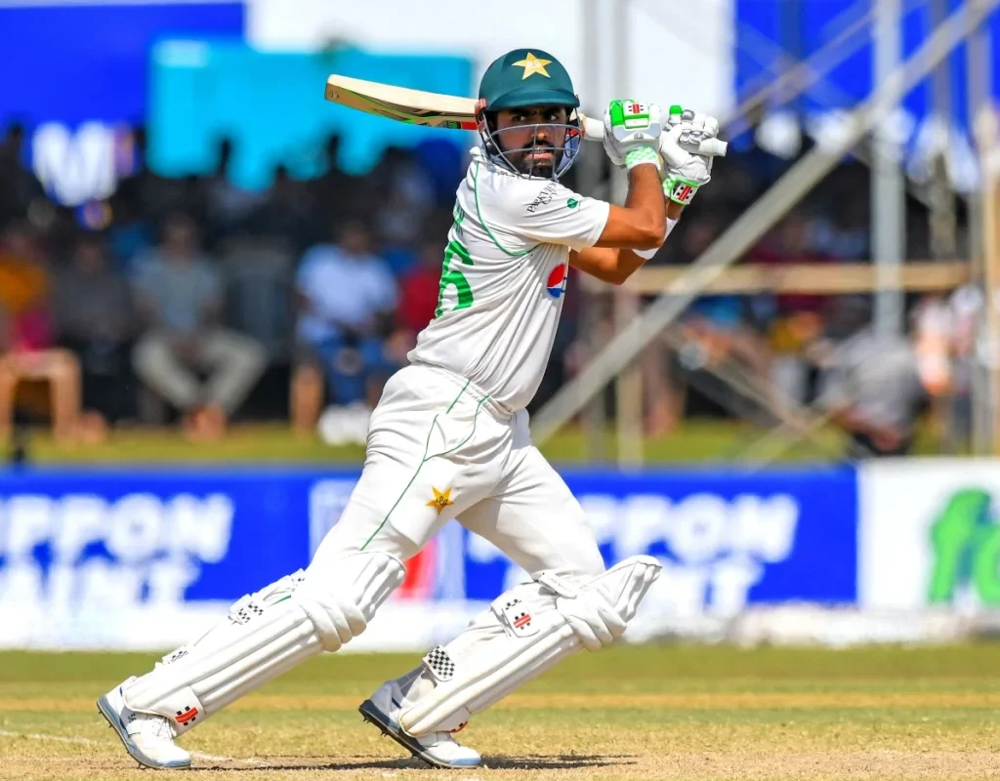

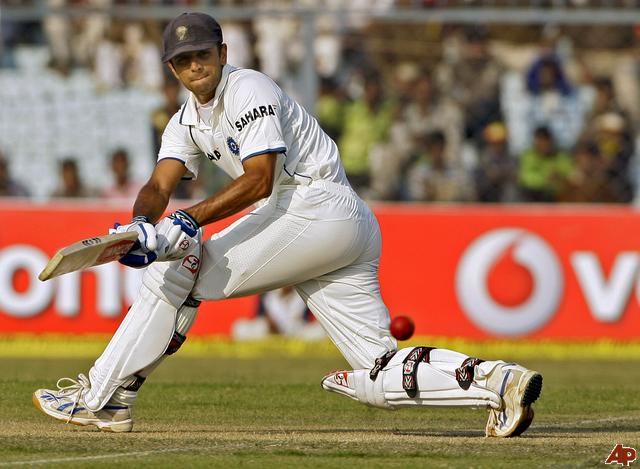

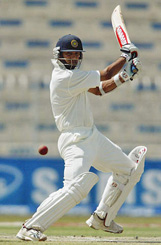

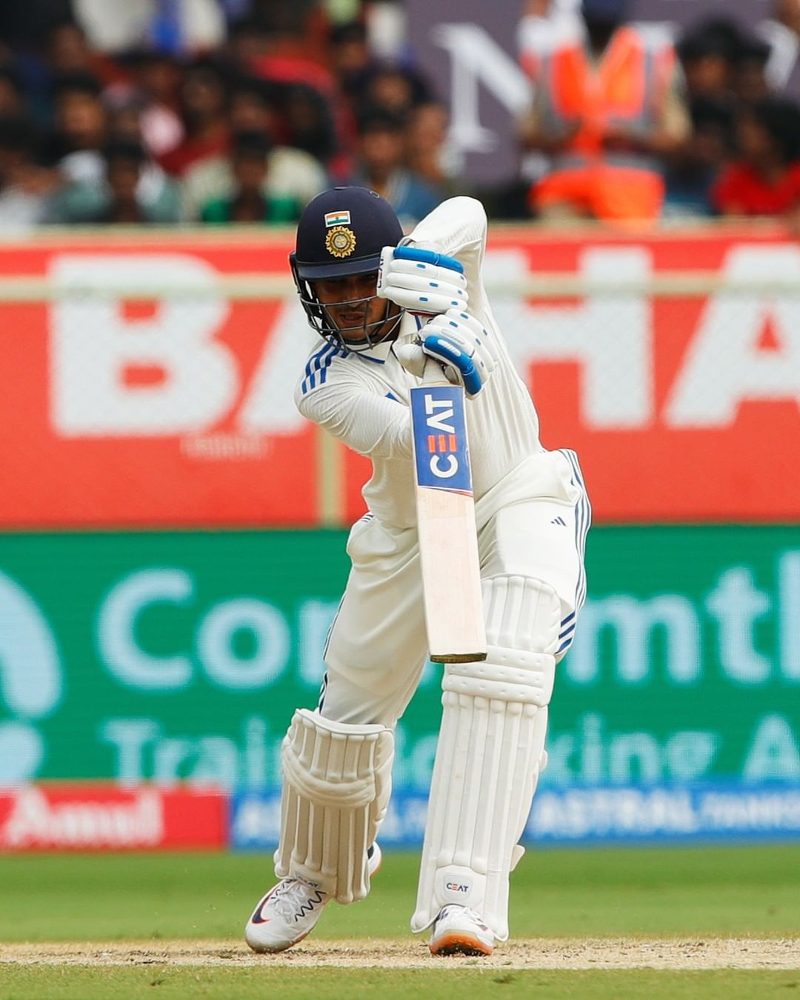

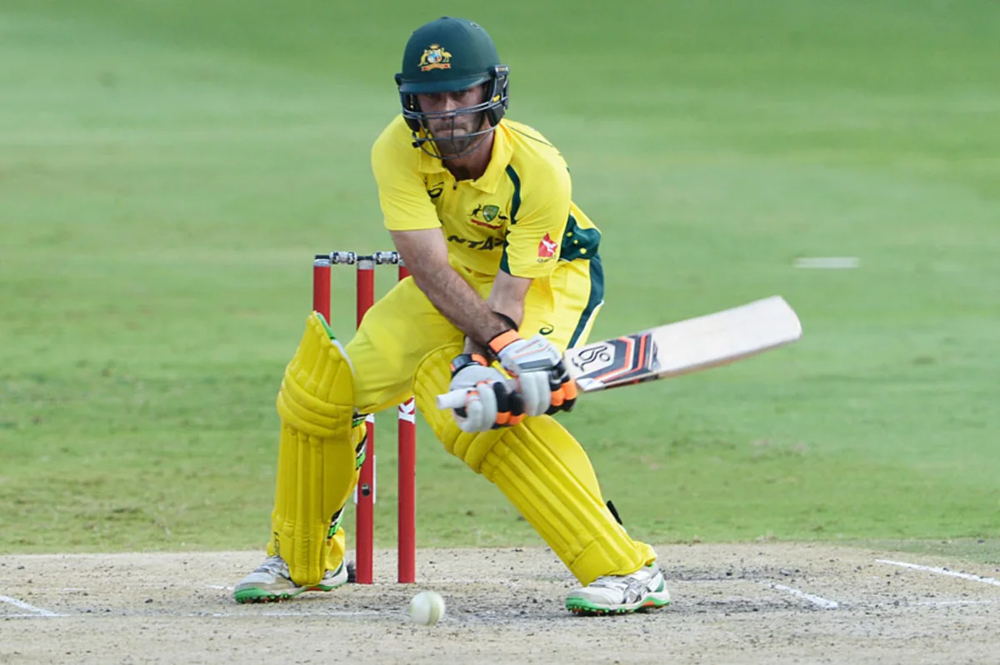

In [ ]:
from google.colab.patches import cv2_imshow

path = '/content/drive/MyDrive/test_images/'
test_images = []

for image_name in os.listdir(path):
    image_path = os.path.join(path, image_name)

    image = cv2.imread(image_path)

    test_images.append(image)
    cv2_imshow(image)

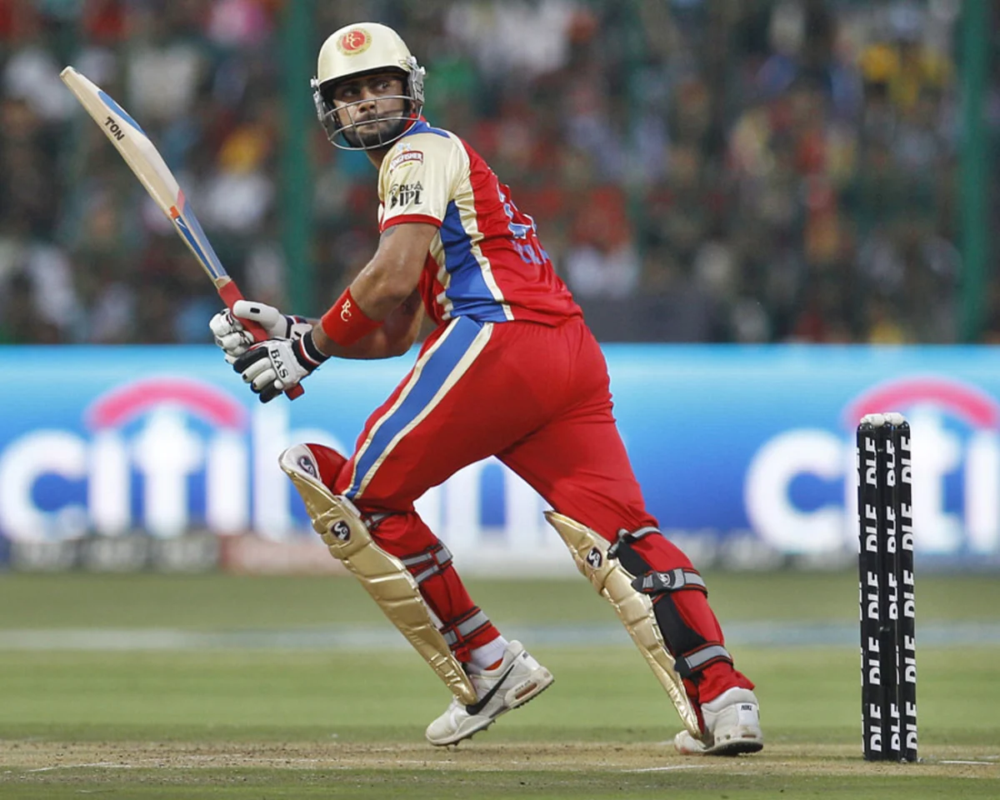

RuntimeError: mat1 and mat2 shapes cannot be multiplied (1x12288 and 34x64)

In [ ]:
from torchvision.transforms import ToTensor
from PIL import Image

for image in test_images:


  # new_image = cv2.resize(new_image, (200, 200))  # Resize the image to match the model input size
  new_image = cv2.resize(image,(64, 64))

  # Convert image to tensor and normalize
  new_image = ToTensor()(new_image).unsqueeze(0)
  # new_image = new_image.astype('float32') / 255.0  # Normalize pixel values to range [0, 1]

  cv2_imshow(image)
  # Make predictions
  with torch.no_grad():
      output = model(new_image.view(-1, 3 * 64 * 64))  # Reshape input for the model
      _, predicted_class = torch.max(output, 1)
      print("Predicted class:", predicted_class.item())

